<a href="https://colab.research.google.com/github/MrPalais/Notebooks/blob/main/Zoom_animation_and_motion_smoothing_VQGAN%2BCLIP_PRE01.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Generate zooming videos with VQGAN and CLIP (z + quantize method with augmentations).

Notebook by Katherine Crowson (https://github.com/crowsonkb, https://twitter.com/RiversHaveWings). The original BigGAN + CLIP method was made by https://twitter.com/advadnoun. 

Also includes [RIFE real-time video interpolation](https://github.com/hzwer/arXiv2020-RIFE) to smooth out the resulting video.

Zoom animation processing and motion interpolation added by https://twitter.com/unltd_dream_co.


In [1]:
# @title Licensed under the MIT License

# Copyright (c) 2021 Katherine Crowson

# Permission is hereby granted, free of charge, to any person obtaining a copy
# of this software and associated documentation files (the "Software"), to deal
# in the Software without restriction, including without limitation the rights
# to use, copy, modify, merge, publish, distribute, sublicense, and/or sell
# copies of the Software, and to permit persons to whom the Software is
# furnished to do so, subject to the following conditions:

# The above copyright notice and this permission notice shall be included in
# all copies or substantial portions of the Software.

# THE SOFTWARE IS PROVIDED "AS IS", WITHOUT WARRANTY OF ANY KIND, EXPRESS OR
# IMPLIED, INCLUDING BUT NOT LIMITED TO THE WARRANTIES OF MERCHANTABILITY,
# FITNESS FOR A PARTICULAR PURPOSE AND NONINFRINGEMENT. IN NO EVENT SHALL THE
# AUTHORS OR COPYRIGHT HOLDERS BE LIABLE FOR ANY CLAIM, DAMAGES OR OTHER
# LIABILITY, WHETHER IN AN ACTION OF CONTRACT, TORT OR OTHERWISE, ARISING FROM,
# OUT OF OR IN CONNECTION WITH THE SOFTWARE OR THE USE OR OTHER DEALINGS IN
# THE SOFTWARE.

In [2]:
!nvidia-smi

Wed Apr 20 12:16:38 2022       
+-----------------------------------------------------------------------------+
| NVIDIA-SMI 460.32.03    Driver Version: 460.32.03    CUDA Version: 11.2     |
|-------------------------------+----------------------+----------------------+
| GPU  Name        Persistence-M| Bus-Id        Disp.A | Volatile Uncorr. ECC |
| Fan  Temp  Perf  Pwr:Usage/Cap|         Memory-Usage | GPU-Util  Compute M. |
|                               |                      |               MIG M. |
|===============================+======================+======================|
|   0  Tesla T4            Off  | 00000000:00:04.0 Off |                    0 |
| N/A   33C    P8     9W /  70W |      0MiB / 15109MiB |      0%      Default |
|                               |                      |                  N/A |
+-------------------------------+----------------------+----------------------+
                                                                               
+-------

In [3]:
# @title Download the libraries
# @markdown This may take a while...

print("Downloading CLIP...")
!git clone https://github.com/openai/CLIP                 &> /dev/null
 
print("Installing the Python AI libraries...")

!git clone https://github.com/CompVis/taming-transformers &> /dev/null
!pip install ftfy regex tqdm omegaconf pytorch-lightning  &> /dev/null
!pip install kornia                                       &> /dev/null
!pip install einops                                       &> /dev/null
 
print("Installing libraries for managing metadata.")
!pip install stegano                                      &> /dev/null
!apt install exempi                                       &> /dev/null
!pip install python-xmp-toolkit                           &> /dev/null
!pip install imgtag                                       &> /dev/null
!pip install pillow==7.1.2                                &> /dev/null
 
print("Installing libraries for creating the videos.")
!pip install imageio-ffmpeg &> /dev/null
!mkdir steps
!mkdir output


Installing the Python AI libraries...
Installing libraries for managing metadata.
Installing libraries for creating the videos.


In [14]:
# @title Import definitions
 
import argparse
import math
from pathlib import Path
import sys
from IPython.display import clear_output
import shutil
import subprocess
from subprocess import Popen, PIPE

sys.path.append('./taming-transformers')
from IPython import display
from base64 import b64encode
from omegaconf import OmegaConf
from PIL import Image
from taming.models import cond_transformer, vqgan
import torch
from torch import nn, optim
from torch.nn import functional as F
from torchvision import transforms
from torchvision.transforms import functional as TF
from tqdm.notebook import tqdm


from CLIP import clip
import kornia.augmentation as K
import numpy as np
import imageio
from PIL import ImageFile, Image, ImageOps, ImageChops
from imgtag import ImgTag    # metadatos 
from libxmp import *         # metadatos
import libxmp                # metadatos
from stegano import lsb
import json
ImageFile.LOAD_TRUNCATED_IMAGES = True
 
def sinc(x):
    return torch.where(x != 0, torch.sin(math.pi * x) / (math.pi * x), x.new_ones([]))
 
 
def lanczos(x, a):
    cond = torch.logical_and(-a < x, x < a)
    out = torch.where(cond, sinc(x) * sinc(x/a), x.new_zeros([]))
    return out / out.sum()
 
 
def ramp(ratio, width):
    n = math.ceil(width / ratio + 1)
    out = torch.empty([n])
    cur = 0
    for i in range(out.shape[0]):
        out[i] = cur
        cur += ratio
    return torch.cat([-out[1:].flip([0]), out])[1:-1]
 
 
def resample(input, size, align_corners=True):
    n, c, h, w = input.shape
    dh, dw = size
 
    input = input.view([n * c, 1, h, w])
 
    if dh < h:
        kernel_h = lanczos(ramp(dh / h, 2), 2).to(input.device, input.dtype)
        pad_h = (kernel_h.shape[0] - 1) // 2
        input = F.pad(input, (0, 0, pad_h, pad_h), 'reflect')
        input = F.conv2d(input, kernel_h[None, None, :, None])
 
    if dw < w:
        kernel_w = lanczos(ramp(dw / w, 2), 2).to(input.device, input.dtype)
        pad_w = (kernel_w.shape[0] - 1) // 2
        input = F.pad(input, (pad_w, pad_w, 0, 0), 'reflect')
        input = F.conv2d(input, kernel_w[None, None, None, :])
 
    input = input.view([n, c, h, w])
    return F.interpolate(input, size, mode='bicubic', align_corners=align_corners)
 
 
class ReplaceGrad(torch.autograd.Function):
    @staticmethod
    def forward(ctx, x_forward, x_backward):
        ctx.shape = x_backward.shape
        return x_forward
 
    @staticmethod
    def backward(ctx, grad_in):
        return None, grad_in.sum_to_size(ctx.shape)
 
 
replace_grad = ReplaceGrad.apply
 
 
class ClampWithGrad(torch.autograd.Function):
    @staticmethod
    def forward(ctx, input, min, max):
        ctx.min = min
        ctx.max = max
        ctx.save_for_backward(input)
        return input.clamp(min, max)
 
    @staticmethod
    def backward(ctx, grad_in):
        input, = ctx.saved_tensors
        return grad_in * (grad_in * (input - input.clamp(ctx.min, ctx.max)) >= 0), None, None
 
 
clamp_with_grad = ClampWithGrad.apply
 
 
def vector_quantize(x, codebook):
    d = x.pow(2).sum(dim=-1, keepdim=True) + codebook.pow(2).sum(dim=1) - 2 * x @ codebook.T
    indices = d.argmin(-1)
    x_q = F.one_hot(indices, codebook.shape[0]).to(d.dtype) @ codebook
    return replace_grad(x_q, x)
 
 
class Prompt(nn.Module):
    def __init__(self, embed, weight=1., stop=float('-inf')):
        super().__init__()
        self.register_buffer('embed', embed)
        self.register_buffer('weight', torch.as_tensor(weight))
        self.register_buffer('stop', torch.as_tensor(stop))
 
    def forward(self, input):
        input_normed = F.normalize(input.unsqueeze(1), dim=2)
        embed_normed = F.normalize(self.embed.unsqueeze(0), dim=2)
        dists = input_normed.sub(embed_normed).norm(dim=2).div(2).arcsin().pow(2).mul(2)
        dists = dists * self.weight.sign()
        return self.weight.abs() * replace_grad(dists, torch.maximum(dists, self.stop)).mean()
 
 
def parse_prompt(prompt):
    vals = prompt.rsplit(':', 2)
    vals = vals + ['', '1', '-inf'][len(vals):]
    return vals[0], float(vals[1]), float(vals[2])
 
 
class MakeCutouts(nn.Module):
    def __init__(self, cut_size, cutn, cut_pow=1.):
        super().__init__()
        self.cut_size = cut_size
        self.cutn = cutn
        self.cut_pow = cut_pow
        self.augs = nn.Sequential(
            K.RandomHorizontalFlip(p=0.5),
            # K.RandomSolarize(0.01, 0.01, p=0.7),
            K.RandomSharpness(0.3,p=0.4),
            K.RandomAffine(degrees=30, translate=0.1, p=0.8, padding_mode='border'),
            K.RandomPerspective(0.2,p=0.4),
            K.ColorJitter(hue=0.01, saturation=0.01, p=0.7))
        self.noise_fac = 0.1
 
 
    def forward(self, input):
        sideY, sideX = input.shape[2:4]
        max_size = min(sideX, sideY)
        min_size = min(sideX, sideY, self.cut_size)
        cutouts = []
        for _ in range(self.cutn):
            size = int(torch.rand([])**self.cut_pow * (max_size - min_size) + min_size)
            offsetx = torch.randint(0, sideX - size + 1, ())
            offsety = torch.randint(0, sideY - size + 1, ())
            cutout = input[:, :, offsety:offsety + size, offsetx:offsetx + size]
            cutouts.append(resample(cutout, (self.cut_size, self.cut_size)))
        batch = self.augs(torch.cat(cutouts, dim=0))
        if self.noise_fac:
            facs = batch.new_empty([self.cutn, 1, 1, 1]).uniform_(0, self.noise_fac)
            batch = batch + facs * torch.randn_like(batch)
        return batch
 
 
def load_vqgan_model(config_path, checkpoint_path):
    config = OmegaConf.load(config_path)
    if config.model.target == 'taming.models.vqgan.VQModel':
        model = vqgan.VQModel(**config.model.params)
        model.eval().requires_grad_(False)
        model.init_from_ckpt(checkpoint_path)
    elif config.model.target == 'taming.models.cond_transformer.Net2NetTransformer':
        parent_model = cond_transformer.Net2NetTransformer(**config.model.params)
        parent_model.eval().requires_grad_(False)
        parent_model.init_from_ckpt(checkpoint_path)
        model = parent_model.first_stage_model
    else:
        raise ValueError(f'unknown model type: {config.model.target}')
    del model.loss
    return model
 
 
def resize_image(image, out_size):
    ratio = image.size[0] / image.size[1]
    area = min(image.size[0] * image.size[1], out_size[0] * out_size[1])
    size = round((area * ratio)**0.5), round((area / ratio)**0.5)
    return image.resize(size, Image.LANCZOS)

## Create the starting frame



In [31]:
!wget https://cdn.create.vista.com/api/media/small/186873560/stock-photo-dark-textured-background -O /content/first.jpg

--2022-04-20 12:42:02--  https://cdn.create.vista.com/api/media/small/186873560/stock-photo-dark-textured-background
Resolving cdn.create.vista.com (cdn.create.vista.com)... 104.18.10.227, 104.18.11.227, 2606:4700::6812:ae3, ...
Connecting to cdn.create.vista.com (cdn.create.vista.com)|104.18.10.227|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: unspecified [image/jpeg]
Saving to: ‘/content/first.jpg’

/content/first.jpg      [ <=>                ]  33.05K  --.-KB/s    in 0s      

2022-04-20 12:42:03 (131 MB/s) - ‘/content/first.jpg’ saved [33843]



In [32]:
#@title Initial run
textos = "detailed colorful translucent bioluminescent glowing fireflies colorful friendly creatures with translucent fractal detailed tentacles | black background: 1 | artstation" #@param {type:"string"}
ancho =  711#@param {type:"number"}
alto =  400#@param {type:"number"}
modelo = "vqgan_imagenet_f16_16384" #@param ["vqgan_imagenet_f16_16384", "vqgan_imagenet_f16_1024", "wikiart_1024", "wikiart_16384", "coco", "faceshq", "sflckr"]
intervalo_imagenes =  20#@param {type:"number"}
imagen_inicial = "/content/first.jpg"#@param {type:"string"}
imagenes_objetivo = ""#@param {type:"string"}
seed = -1#@param {type:"number"}
max_iteraciones = 500#@param {type:"number"}
input_images = ""

nombres_modelos={"vqgan_imagenet_f16_16384": 'ImageNet 16384',"vqgan_imagenet_f16_1024":"ImageNet 1024", 
                 "wikiart_1024":"WikiArt 1024", "wikiart_16384":"WikiArt 16384", "coco":"COCO-Stuff", "faceshq":"FacesHQ", "sflckr":"S-FLCKR"}
nombre_modelo = nombres_modelos[modelo]     

if seed == -1:
    seed = None
if imagen_inicial == "None":
    imagen_inicial = None
if imagenes_objetivo == "None" or not imagenes_objetivo:
    imagenes_objetivo = []
else:
    imagenes_objetivo = imagenes_objetivo.split("|")
    imagenes_objetivo = [image.strip() for image in imagenes_objetivo]

if imagen_inicial or imagenes_objetivo != []:
    input_images = True

textos = [frase.strip() for frase in textos.split("|")]
if textos == ['']:
    textos = []


args = argparse.Namespace(
    prompts=textos,
    image_prompts=imagenes_objetivo,
    noise_prompt_seeds=[],
    noise_prompt_weights=[],
    size=[ancho, alto],
    init_image=imagen_inicial,
    init_weight=0.,
    clip_model='ViT-B/32',
    vqgan_config=f'/content/drive/MyDrive/VQGAN/models/vqgan_imagenet_f16_16384.yaml',
    vqgan_checkpoint=f'/content/drive/MyDrive/VQGAN/models/vqgan_imagenet_f16_16384.ckpt',
    step_size=0.1,
    cutn=64,
    cut_pow=1.,
    display_freq=intervalo_imagenes,
    seed=seed,
)

In [33]:
!mkdir -p /content/drive/MyDrive/VQGAN/models/
!curl -L -o /content/drive/MyDrive/VQGAN/models/vqgan_imagenet_f16_16384.yaml -C - 'https://heibox.uni-heidelberg.de/d/a7530b09fed84f80a887/files/?p=%2Fconfigs%2Fmodel.yaml&dl=1' #ImageNet 16384
!curl -L -o /content/drive/MyDrive/VQGAN/models/vqgan_imagenet_f16_16384.ckpt -C - 'https://heibox.uni-heidelberg.de/d/a7530b09fed84f80a887/files/?p=%2Fckpts%2Flast.ckpt&dl=1' #ImageNet 16384

** Resuming transfer from byte position 692
  % Total    % Received % Xferd  Average Speed   Time    Time     Time  Current
                                 Dload  Upload   Total   Spent    Left  Speed
  0     0    0     0    0     0      0      0 --:--:--  0:00:01 --:--:--     0
  0     0    0     0    0     0      0      0 --:--:--  0:00:01 --:--:--     0
** Resuming transfer from byte position 980092370
  % Total    % Received % Xferd  Average Speed   Time    Time     Time  Current
                                 Dload  Upload   Total   Spent    Left  Speed
  0     0    0     0    0     0      0      0 --:--:-- --:--:-- --:--:--     0
  0     0    0     0    0     0      0      0 --:--:-- --:--:-- --:--:--     0


Using device: cuda:0
Using texts: ['detailed colorful translucent bioluminescent glowing fireflies colorful friendly creatures with translucent fractal detailed tentacles', 'black background: 1', 'artstation']
Using seed: 7986383172473961543
Working with z of shape (1, 256, 16, 16) = 65536 dimensions.
loaded pretrained LPIPS loss from taming/modules/autoencoder/lpips/vgg.pth
VQLPIPSWithDiscriminator running with hinge loss.
Restored from /content/drive/MyDrive/VQGAN/models/vqgan_imagenet_f16_16384.ckpt


0it [00:00, ?it/s]

/usr/local/lib/python3.7/dist-packages/torch/functional.py:445: UserWarning: torch.meshgrid: in an upcoming release, it will be required to pass the indexing argument. (Triggered internally at  ../aten/src/ATen/native/TensorShape.cpp:2157.)
  return _VF.meshgrid(tensors, **kwargs)  # type: ignore[attr-defined]


i: 0, loss: 2.71554, losses: 0.946662, 0.858054, 0.910821


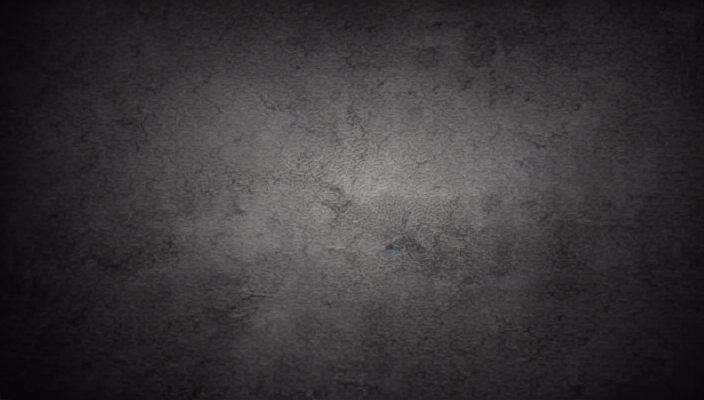

i: 20, loss: 2.54838, losses: 0.829997, 0.834551, 0.883835


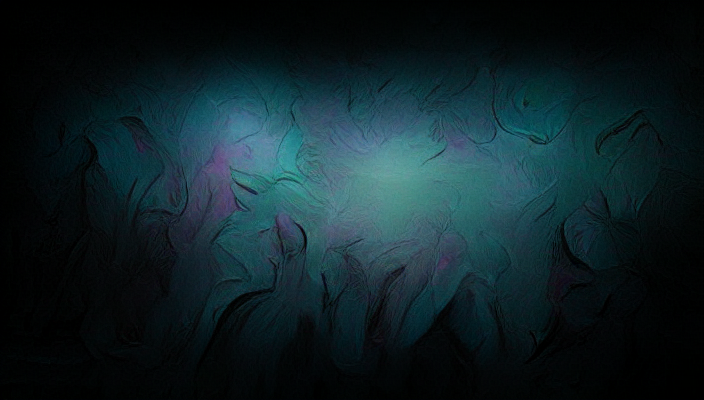

i: 40, loss: 2.55756, losses: 0.822091, 0.849957, 0.885515


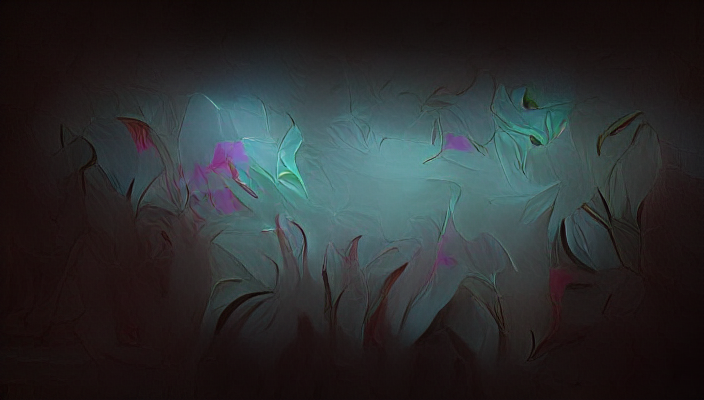

i: 60, loss: 2.52094, losses: 0.793916, 0.857807, 0.869222


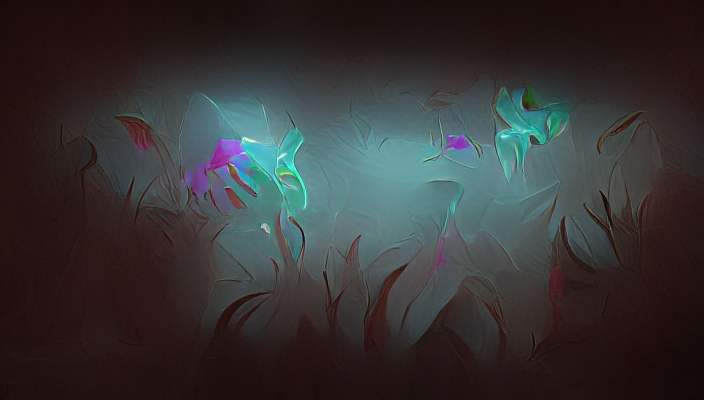

i: 80, loss: 2.51267, losses: 0.79039, 0.855571, 0.866705


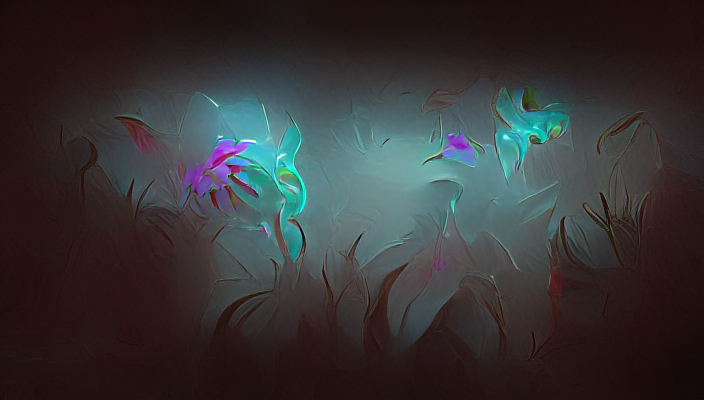

i: 100, loss: 2.50122, losses: 0.786107, 0.859311, 0.855806


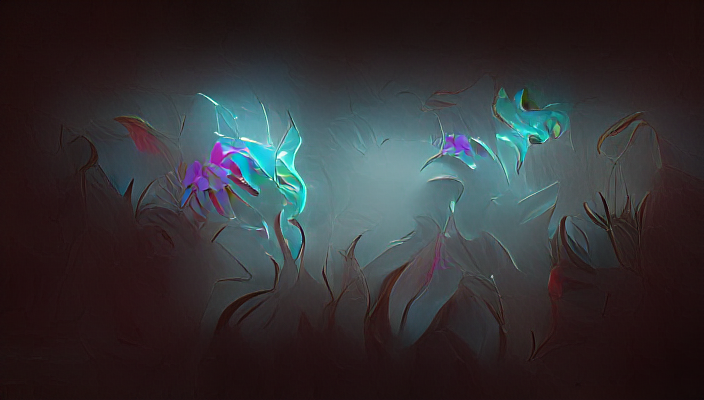

i: 120, loss: 2.47633, losses: 0.771866, 0.851146, 0.853316


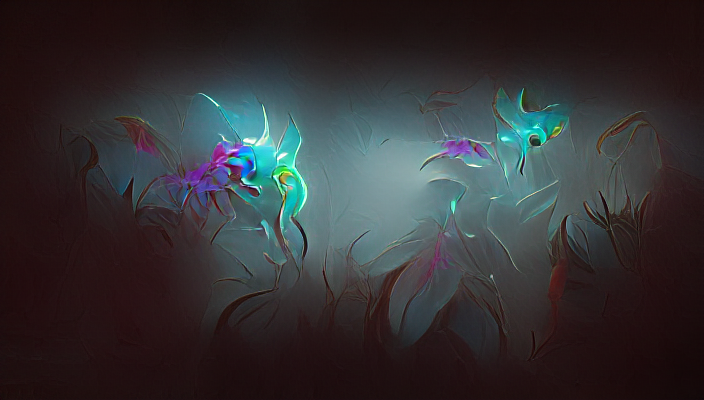

i: 140, loss: 2.4659, losses: 0.763731, 0.851624, 0.850544


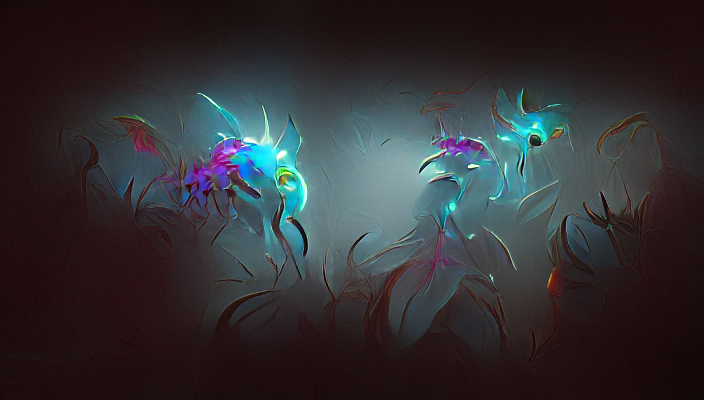

i: 160, loss: 2.44921, losses: 0.75616, 0.848299, 0.844751


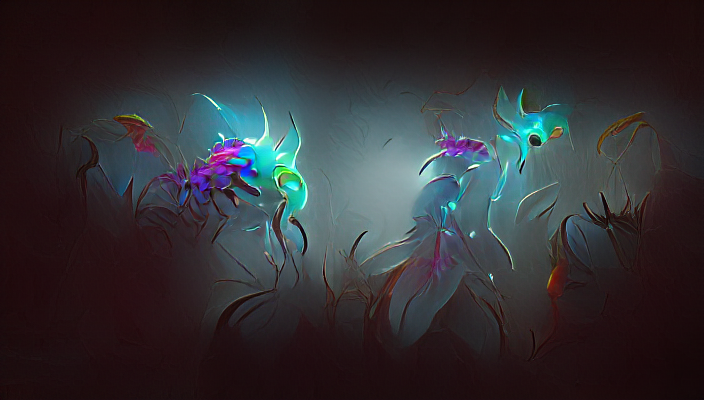

i: 180, loss: 2.44155, losses: 0.755356, 0.845049, 0.841141


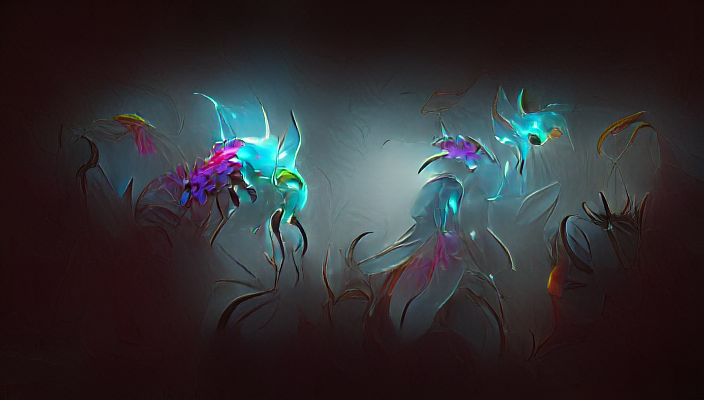

i: 200, loss: 2.43401, losses: 0.746628, 0.839333, 0.848054


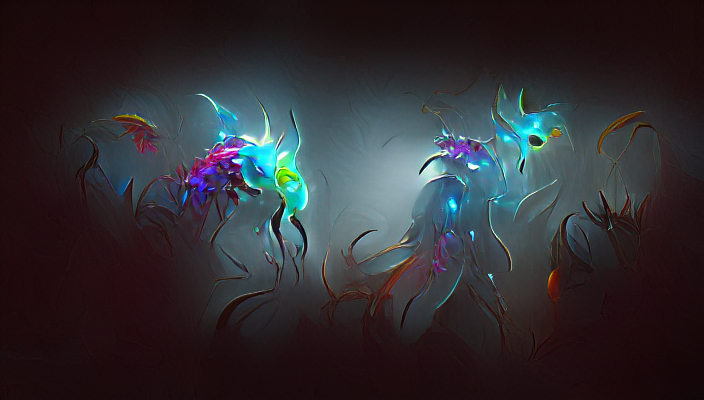

i: 220, loss: 2.42313, losses: 0.741008, 0.837151, 0.844969


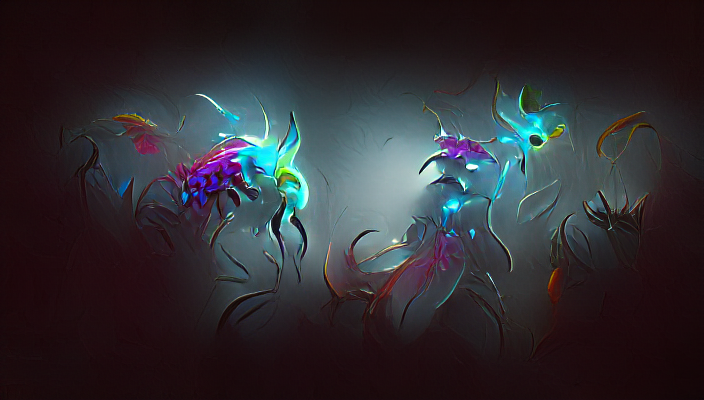

i: 240, loss: 2.41874, losses: 0.742461, 0.831956, 0.844322


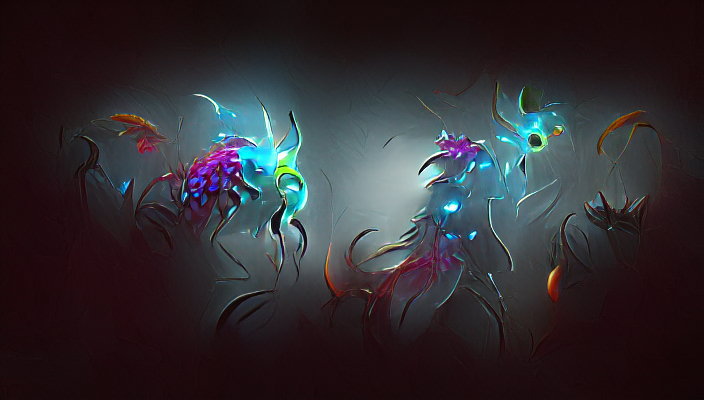

i: 260, loss: 2.42522, losses: 0.742754, 0.838274, 0.844194


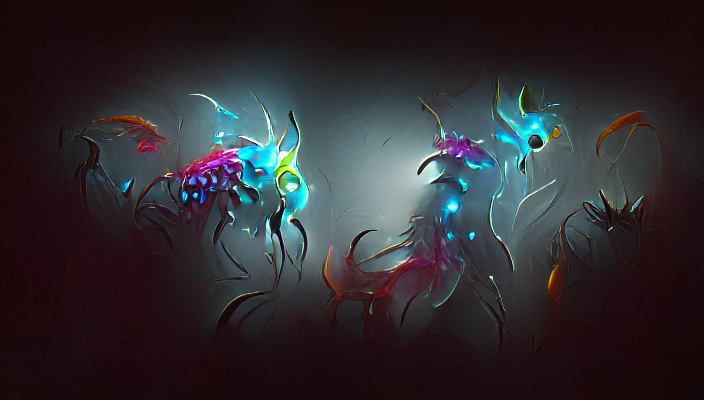

i: 280, loss: 2.41355, losses: 0.736171, 0.831406, 0.845975


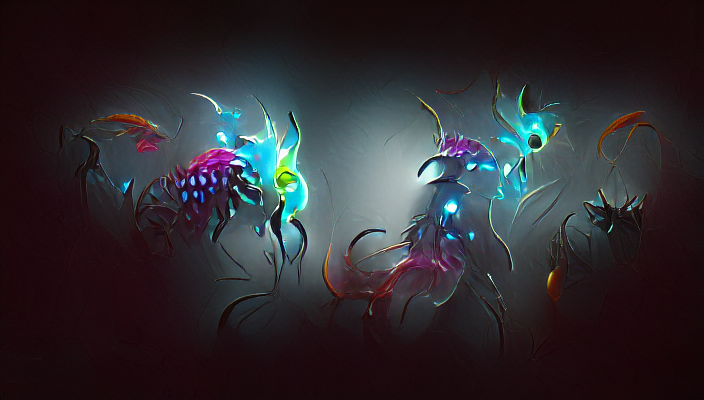

i: 300, loss: 2.40661, losses: 0.736381, 0.828836, 0.841394


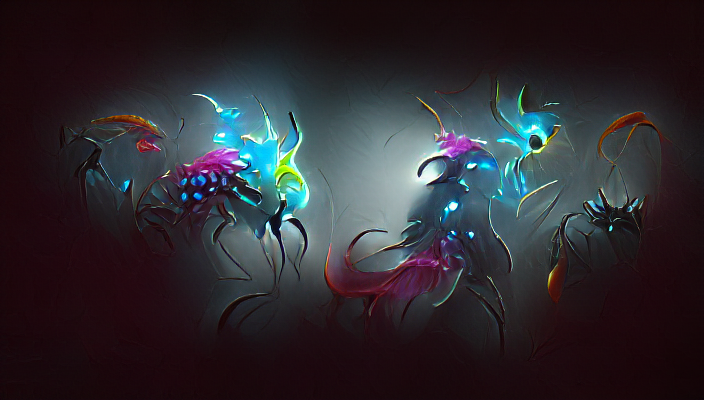

i: 320, loss: 2.40509, losses: 0.734873, 0.826718, 0.843503


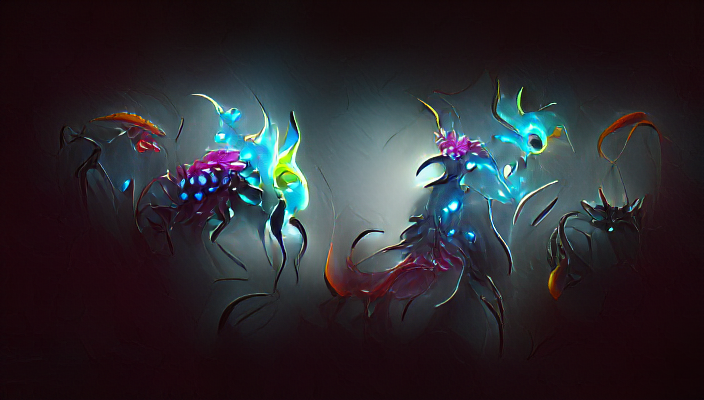

i: 340, loss: 2.39544, losses: 0.727361, 0.826217, 0.841862


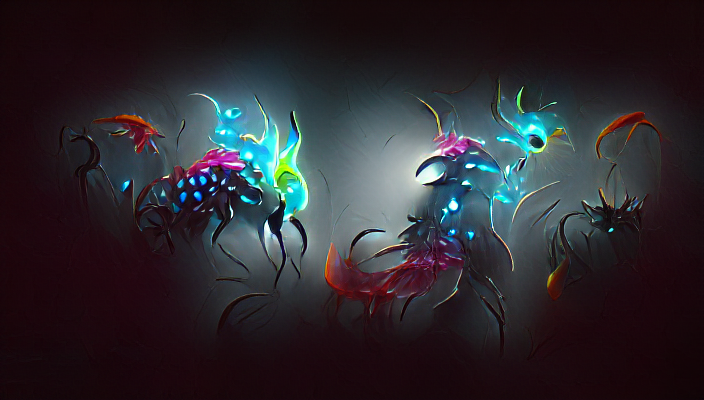

i: 360, loss: 2.39132, losses: 0.725783, 0.823758, 0.841777


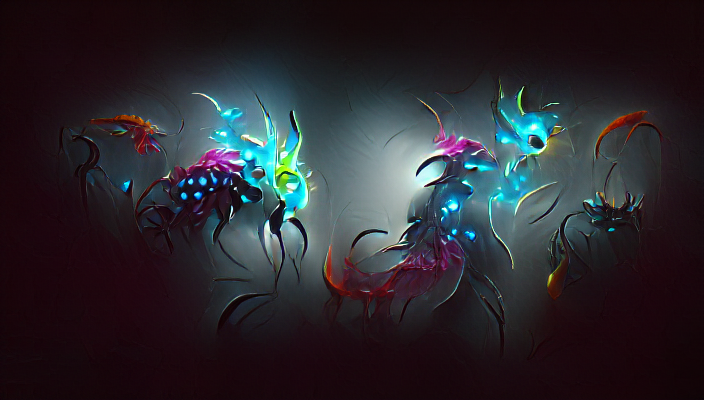

i: 380, loss: 2.39684, losses: 0.724889, 0.828909, 0.843041


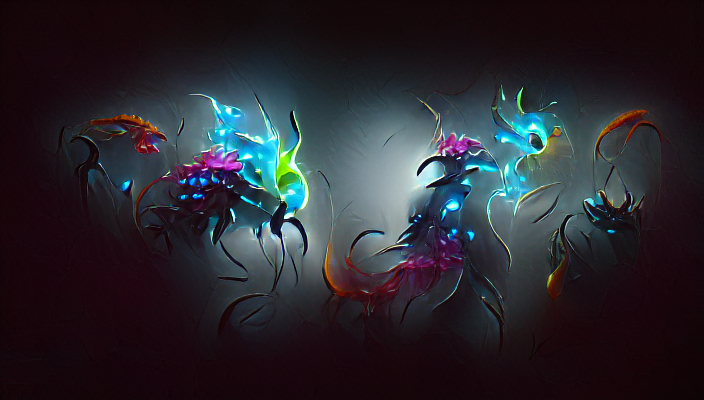

i: 400, loss: 2.38713, losses: 0.725077, 0.822078, 0.83997


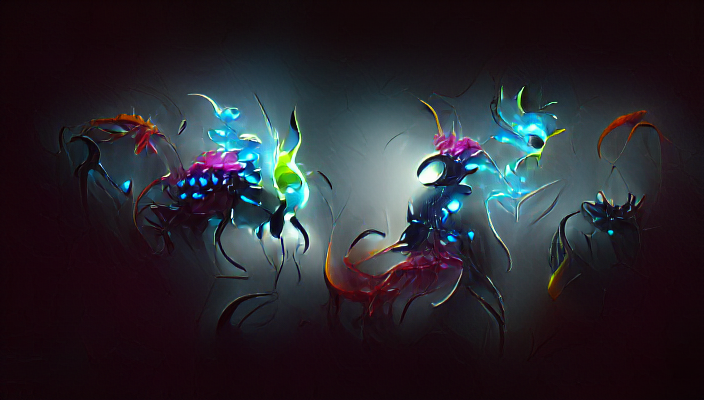

i: 420, loss: 2.38718, losses: 0.723356, 0.819057, 0.844766


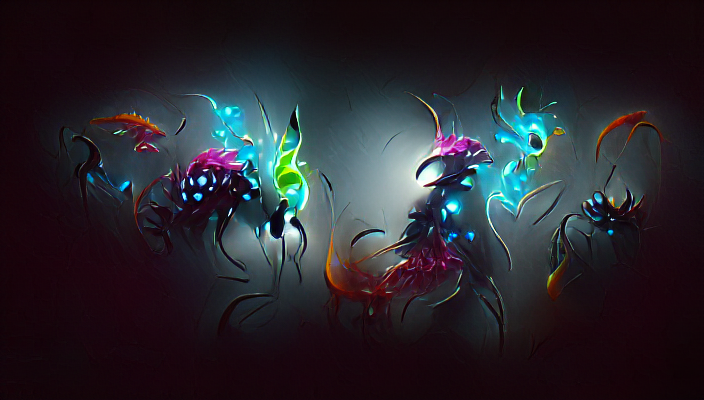

i: 440, loss: 2.38984, losses: 0.724953, 0.821707, 0.843184


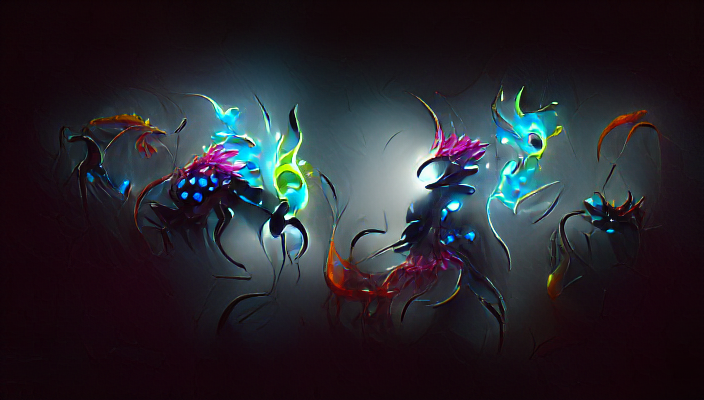

i: 460, loss: 2.37886, losses: 0.717107, 0.821393, 0.840363


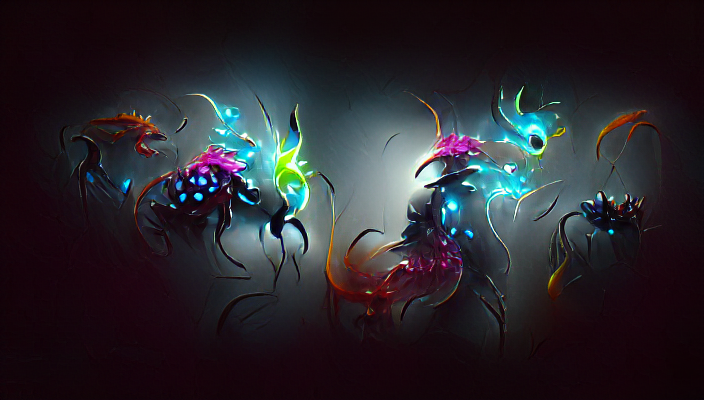

i: 480, loss: 2.37933, losses: 0.7183, 0.820689, 0.840346


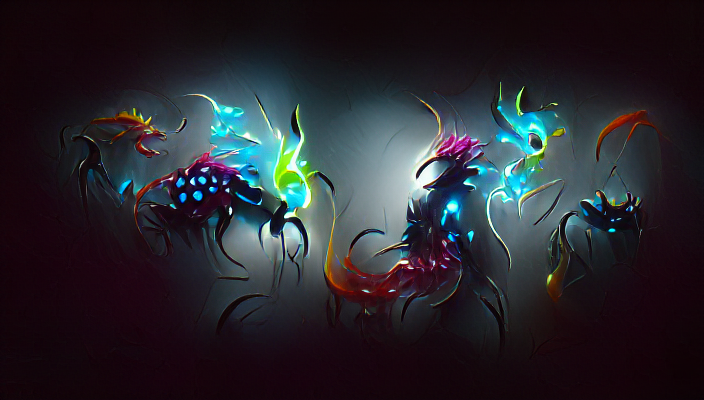

i: 500, loss: 2.38318, losses: 0.72181, 0.822375, 0.838993


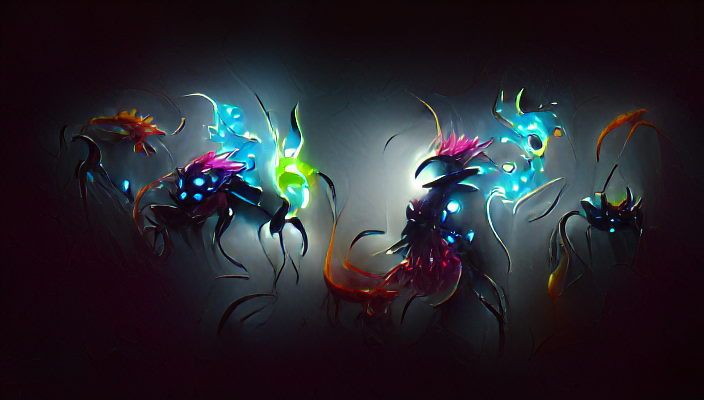

In [34]:
#@title Run the script...
device = torch.device('cuda:0' if torch.cuda.is_available() else 'cpu')
print('Using device:', device)
if textos:
    print('Using texts:', textos)
if imagenes_objetivo:
    print('Using image prompts:', imagenes_objetivo)
if args.seed is None:
    seed = torch.seed()
else:
    seed = args.seed
torch.manual_seed(seed)
print('Using seed:', seed)

model = load_vqgan_model(args.vqgan_config, args.vqgan_checkpoint).to(device)
perceptor = clip.load(args.clip_model, jit=False)[0].eval().requires_grad_(False).to(device)

cut_size = perceptor.visual.input_resolution
e_dim = model.quantize.e_dim
f = 2**(model.decoder.num_resolutions - 1)
make_cutouts = MakeCutouts(cut_size, args.cutn, cut_pow=args.cut_pow)
n_toks = model.quantize.n_e
toksX, toksY = args.size[0] // f, args.size[1] // f
sideX, sideY = toksX * f, toksY * f
z_min = model.quantize.embedding.weight.min(dim=0).values[None, :, None, None]
z_max = model.quantize.embedding.weight.max(dim=0).values[None, :, None, None]


if args.init_image:
    pil_image = Image.open(args.init_image).convert('RGB')
    pil_image = pil_image.resize((sideX, sideY), Image.LANCZOS)
    z, *_ = model.encode(TF.to_tensor(pil_image).to(device).unsqueeze(0) * 2 - 1)
else:
    one_hot = F.one_hot(torch.randint(n_toks, [toksY * toksX], device=device), n_toks).float()
    z = one_hot @ model.quantize.embedding.weight
    z = z.view([-1, toksY, toksX, e_dim]).permute(0, 3, 1, 2)
z_orig = z.clone()
z.requires_grad_(True)
opt = optim.Adam([z], lr=args.step_size)

normalize = transforms.Normalize(mean=[0.48145466, 0.4578275, 0.40821073],
                                 std=[0.26862954, 0.26130258, 0.27577711])

pMs = []

for prompt in args.prompts:
    txt, weight, stop = parse_prompt(prompt)
    embed = perceptor.encode_text(clip.tokenize(txt).to(device)).float()
    pMs.append(Prompt(embed, weight, stop).to(device))

for prompt in args.image_prompts:
    path, weight, stop = parse_prompt(prompt)
    img = resize_image(Image.open(path).convert('RGB'), (sideX, sideY))
    batch = make_cutouts(TF.to_tensor(img).unsqueeze(0).to(device))
    embed = perceptor.encode_image(normalize(batch)).float()
    pMs.append(Prompt(embed, weight, stop).to(device))

for seed, weight in zip(args.noise_prompt_seeds, args.noise_prompt_weights):
    gen = torch.Generator().manual_seed(seed)
    embed = torch.empty([1, perceptor.visual.output_dim]).normal_(generator=gen)
    pMs.append(Prompt(embed, weight).to(device))

def synth(z):
    z_q = vector_quantize(z.movedim(1, 3), model.quantize.embedding.weight).movedim(3, 1)
    return clamp_with_grad(model.decode(z_q).add(1).div(2), 0, 1)

def add_xmp_data(nombrefichero):
    imagen = ImgTag(filename=nombrefichero)
    imagen.xmp.append_array_item(libxmp.consts.XMP_NS_DC, 'creator', 'VQGAN+CLIP', {"prop_array_is_ordered":True, "prop_value_is_array":True})
    if args.prompts:
        imagen.xmp.append_array_item(libxmp.consts.XMP_NS_DC, 'title', " | ".join(args.prompts), {"prop_array_is_ordered":True, "prop_value_is_array":True})
    else:
        imagen.xmp.append_array_item(libxmp.consts.XMP_NS_DC, 'title', 'None', {"prop_array_is_ordered":True, "prop_value_is_array":True})
    imagen.xmp.append_array_item(libxmp.consts.XMP_NS_DC, 'i', str(i), {"prop_array_is_ordered":True, "prop_value_is_array":True})
    imagen.xmp.append_array_item(libxmp.consts.XMP_NS_DC, 'model', nombre_modelo, {"prop_array_is_ordered":True, "prop_value_is_array":True})
    imagen.xmp.append_array_item(libxmp.consts.XMP_NS_DC, 'seed',str(seed) , {"prop_array_is_ordered":True, "prop_value_is_array":True})
    imagen.xmp.append_array_item(libxmp.consts.XMP_NS_DC, 'input_images',str(input_images) , {"prop_array_is_ordered":True, "prop_value_is_array":True})
    #for frases in args.prompts:
    #    imagen.xmp.append_array_item(libxmp.consts.XMP_NS_DC, 'Prompt' ,frases, {"prop_array_is_ordered":True, "prop_value_is_array":True})
    imagen.close()

def add_stegano_data(filename):
    data = {
        "notebook": "VQGAN+CLIP",
        "i": i,
        "seed": str(seed),
    }
    lsb.hide(filename, json.dumps(data)).save(filename)

@torch.no_grad()
def checkin(i, losses):
    losses_str = ', '.join(f'{loss.item():g}' for loss in losses)
    tqdm.write(f'i: {i}, loss: {sum(losses).item():g}, losses: {losses_str}')
    out = synth(z)
    TF.to_pil_image(out[0].cpu()).save('progress.png')
    display.display(display.Image('progress.png'))

def ascend_txt():
    global i
    out = synth(z)
    iii = perceptor.encode_image(normalize(make_cutouts(out))).float()

    result = []

    if args.init_weight:
        result.append(F.mse_loss(z, z_orig) * args.init_weight / 2)

    for prompt in pMs:
        result.append(prompt(iii))
    img = np.array(out.mul(255).clamp(0, 255)[0].cpu().detach().numpy().astype(np.uint8))[:,:,:]
    img = np.transpose(img, (1, 2, 0))
    filename = f"steps/{i:04}.png"
    imageio.imwrite(filename, np.array(img))
    add_xmp_data(filename)
    return result

def train(i):
    opt.zero_grad()
    lossAll = ascend_txt()
    if i % args.display_freq == 0:
        checkin(i, lossAll)
    loss = sum(lossAll)
    loss.backward()
    opt.step()
    with torch.no_grad():
        z.copy_(z.maximum(z_min).minimum(z_max))

i = 0
try:
    with tqdm() as pbar:
        while True:
            train(i)
            if i == max_iteraciones:
                break
            i += 1
            pbar.update()
except KeyboardInterrupt:
    pass

In [37]:
z=/content/images.zip
!zip {z} /content/steps/* >/dev/null
!ls -l {z}
!curl --upload-file {z} https://oshi.at/images.zip

  adding: content/steps/0000.png (deflated 0%)
  adding: content/steps/0001.png (deflated 0%)
  adding: content/steps/0002.png (deflated 0%)
  adding: content/steps/0003.png (deflated 0%)
  adding: content/steps/0004.png (deflated 0%)
  adding: content/steps/0005.png (deflated 0%)
  adding: content/steps/0006.png (deflated 0%)
  adding: content/steps/0007.png (deflated 0%)
  adding: content/steps/0008.png (deflated 0%)
  adding: content/steps/0009.png (deflated 0%)
  adding: content/steps/0010.png (deflated 0%)
  adding: content/steps/0011.png (deflated 0%)
  adding: content/steps/0012.png (deflated 0%)
  adding: content/steps/0013.png (deflated 0%)
  adding: content/steps/0014.png (deflated 0%)
  adding: content/steps/0015.png (deflated 0%)
  adding: content/steps/0016.png (deflated 0%)
  adding: content/steps/0017.png (deflated 0%)
  adding: content/steps/0018.png (deflated 0%)
  adding: content/steps/0019.png (deflated 0%)
  adding: content/steps/0020.png (deflated 0%)
  adding: con

# Create the animation

**number_of_frames** = Number of frames you want to generate

**angle** = Number of degrees to rotate per frame

**zoom_per_frame** = How many pixels to zoom in by each frame. Should be divisilbe by 2.

**iterations_per_frame** = How long to spend working on each frame. 

In [35]:
#@title Animation properties

no_of_frames = 200#@param {type:"number"}
angle = 0#@param {type:"number"}
zoom_per_frame = 6#@param {type:"number"}
iterations_per_frame = 100#@param {type:"number"}

zoom_width = (ancho + zoom_per_frame)
zoom_height = (alto + zoom_per_frame)
#crop_coord_left = (zoom_per_frame / 2)
#crop_coord_upper = (zoom_per_frame / 2)
crop_coord_left = 3#@param {type:"number"}
crop_coord_upper = 3#@param {type:"number"}
crop_box = (crop_coord_left, crop_coord_upper, ancho, alto)

shutil.copy(f"steps/{max_iteraciones:04}.png", 'output/0001.png')

'output/0001.png'

In [38]:
!ln -s /content/drive/MyDrive/VQGAN/models/vqgan_imagenet_f16_16384.ckpt /content/vqgan_imagenet_f16_16384.ckpt
!ln -s /content/drive/MyDrive/VQGAN/models/vqgan_imagenet_f16_16384.yaml /content/vqgan_imagenet_f16_16384.yaml

In [ ]:
#@title Create the animation

for n_run in range(1,no_of_frames):
  s_run = str(n_run + 1)
  s_run_prev = str(n_run)
  clear_output()
  imagen_inicial = 'output/' + f'{n_run:04}.png'
  print('Frame',s_run)
  display.Image(imagen_inicial)
  input_images = True


  args = argparse.Namespace(
      prompts=textos,
      image_prompts=imagenes_objetivo,
      noise_prompt_seeds=[],
      noise_prompt_weights=[],
      size=[ancho, alto],
      init_image=imagen_inicial,
      init_weight=0.,
      clip_model='ViT-B/32',
      vqgan_config=f'{modelo}.yaml',
      vqgan_checkpoint=f'{modelo}.ckpt',
      step_size=0.1,
      cutn=64,
      cut_pow=1.,
      display_freq=iterations_per_frame,
      seed=seed,
  )

  device = torch.device('cuda:0' if torch.cuda.is_available() else 'cpu')
  print('Using device:', device)
  if textos:
      print('Using texts:', textos)
  if imagenes_objetivo:
      print('Using image prompts:', imagenes_objetivo)
  if args.seed is None:
      seed = torch.seed()
  else:
      seed = args.seed
  torch.manual_seed(seed)
  print('Using seed:', seed)

  model = load_vqgan_model(args.vqgan_config, args.vqgan_checkpoint).to(device)
  perceptor = clip.load(args.clip_model, jit=False)[0].eval().requires_grad_(False).to(device)

  cut_size = perceptor.visual.input_resolution
  e_dim = model.quantize.e_dim
  f = 2**(model.decoder.num_resolutions - 1)
  make_cutouts = MakeCutouts(cut_size, args.cutn, cut_pow=args.cut_pow)
  n_toks = model.quantize.n_e
  toksX, toksY = args.size[0] // f, args.size[1] // f
  sideX, sideY = toksX * f, toksY * f
  z_min = model.quantize.embedding.weight.min(dim=0).values[None, :, None, None]
  z_max = model.quantize.embedding.weight.max(dim=0).values[None, :, None, None]


  if args.init_image:
      pil_image = Image.open(args.init_image).convert('RGB')
      pil_image = pil_image.resize((sideX, sideY), Image.LANCZOS)
      z, *_ = model.encode(TF.to_tensor(pil_image).to(device).unsqueeze(0) * 2 - 1)
  else:
      one_hot = F.one_hot(torch.randint(n_toks, [toksY * toksX], device=device), n_toks).float()
      z = one_hot @ model.quantize.embedding.weight
      z = z.view([-1, toksY, toksX, e_dim]).permute(0, 3, 1, 2)
  z_orig = z.clone()
  z.requires_grad_(True)
  opt = optim.Adam([z], lr=args.step_size)

  normalize = transforms.Normalize(mean=[0.48145466, 0.4578275, 0.40821073],
                                  std=[0.26862954, 0.26130258, 0.27577711])

  pMs = []

  for prompt in args.prompts:
      txt, weight, stop = parse_prompt(prompt)
      embed = perceptor.encode_text(clip.tokenize(txt).to(device)).float()
      pMs.append(Prompt(embed, weight, stop).to(device))

  for prompt in args.image_prompts:
      path, weight, stop = parse_prompt(prompt)
      img = resize_image(Image.open(path).convert('RGB'), (sideX, sideY))
      batch = make_cutouts(TF.to_tensor(img).unsqueeze(0).to(device))
      embed = perceptor.encode_image(normalize(batch)).float()
      pMs.append(Prompt(embed, weight, stop).to(device))

  for seed, weight in zip(args.noise_prompt_seeds, args.noise_prompt_weights):
      gen = torch.Generator().manual_seed(seed)
      embed = torch.empty([1, perceptor.visual.output_dim]).normal_(generator=gen)
      pMs.append(Prompt(embed, weight).to(device))

  def synth(z):
      z_q = vector_quantize(z.movedim(1, 3), model.quantize.embedding.weight).movedim(3, 1)
      return clamp_with_grad(model.decode(z_q).add(1).div(2), 0, 1)

  def add_xmp_data(nombrefichero):
      imagen = ImgTag(filename=nombrefichero)
      imagen.xmp.append_array_item(libxmp.consts.XMP_NS_DC, 'creator', 'VQGAN+CLIP', {"prop_array_is_ordered":True, "prop_value_is_array":True})
      if args.prompts:
          imagen.xmp.append_array_item(libxmp.consts.XMP_NS_DC, 'title', " | ".join(args.prompts), {"prop_array_is_ordered":True, "prop_value_is_array":True})
      else:
          imagen.xmp.append_array_item(libxmp.consts.XMP_NS_DC, 'title', 'None', {"prop_array_is_ordered":True, "prop_value_is_array":True})
      imagen.xmp.append_array_item(libxmp.consts.XMP_NS_DC, 'i', str(i), {"prop_array_is_ordered":True, "prop_value_is_array":True})
      imagen.xmp.append_array_item(libxmp.consts.XMP_NS_DC, 'model', nombre_modelo, {"prop_array_is_ordered":True, "prop_value_is_array":True})
      imagen.xmp.append_array_item(libxmp.consts.XMP_NS_DC, 'seed',str(seed) , {"prop_array_is_ordered":True, "prop_value_is_array":True})
      imagen.xmp.append_array_item(libxmp.consts.XMP_NS_DC, 'input_images',str(input_images) , {"prop_array_is_ordered":True, "prop_value_is_array":True})
      #for frases in args.prompts:
      #    imagen.xmp.append_array_item(libxmp.consts.XMP_NS_DC, 'Prompt' ,frases, {"prop_array_is_ordered":True, "prop_value_is_array":True})
      imagen.close()

  def add_stegano_data(filename):
      data = {
          "title": " | ".join(args.prompts) if args.prompts else None,
          "notebook": "VQGAN+CLIP",
          "i": i,
          "model": nombre_modelo,
          "seed": str(seed),
          "input_images": input_images
      }
      lsb.hide(filename, json.dumps(data)).save(filename)

  @torch.no_grad()
  def checkin(i, losses):
      losses_str = ', '.join(f'{loss.item():g}' for loss in losses)
      tqdm.write(f'i: {i}, loss: {sum(losses).item():g}, losses: {losses_str}')
      out = synth(z)
      TF.to_pil_image(out[0].cpu()).save('progress.png')
      add_stegano_data('progress.png')
      add_xmp_data('progress.png')
      #display.display(display.Image('progress.png'))

  def ascend_txt():
      global i
      out = synth(z)
      iii = perceptor.encode_image(normalize(make_cutouts(out))).float()

      result = []

      if args.init_weight:
          result.append(F.mse_loss(z, z_orig) * args.init_weight / 2)

      for prompt in pMs:
          result.append(prompt(iii))
      img = np.array(out.mul(255).clamp(0, 255)[0].cpu().detach().numpy().astype(np.uint8))[:,:,:]
      img = np.transpose(img, (1, 2, 0))
      filename = "steps/" + s_run + f"_{i:04}.png"
      imageio.imwrite(filename, np.array(img))
      add_stegano_data(filename)
      add_xmp_data(filename)
      return result

  def train(i):
      opt.zero_grad()
      lossAll = ascend_txt()
      if i % args.display_freq == 0:
          checkin(i, lossAll)
      loss = sum(lossAll)
      loss.backward()
      opt.step()
      with torch.no_grad():
          z.copy_(z.maximum(z_min).minimum(z_max))

  i = 0
  try:
      with tqdm() as pbar:
          while True:
              train(i)
              if i == iterations_per_frame:
                  break
              i += 1
              pbar.update()
  except KeyboardInterrupt:
      pass
  img = Image.open("steps/" + s_run + f"_{iterations_per_frame:04}.png")
  img_edited = img.rotate(angle).resize((zoom_width, zoom_height), resample=Image.NEAREST).crop(crop_box)
  final_image = ('output/' + f'{s_run:>04}.png')
  img_edited.save(final_image)
  

Frame 34
Using device: cuda:0
Using texts: ['detailed colorful translucent bioluminescent glowing fireflies colorful friendly creatures with translucent fractal detailed tentacles', 'black background: 1', 'artstation']
Using seed: 7986383172473961543
Working with z of shape (1, 256, 16, 16) = 65536 dimensions.
loaded pretrained LPIPS loss from taming/modules/autoencoder/lpips/vgg.pth
VQLPIPSWithDiscriminator running with hinge loss.
Restored from vqgan_imagenet_f16_16384.ckpt


0it [00:00, ?it/s]

i: 0, loss: 2.34473, losses: 0.695806, 0.80506, 0.84386


## Generate the video

From just the frames

In [ ]:
init_frame = 1 #Starting frame
last_frame = 101#@param {type:"number"}
fps = 10#@param {type:"number"}
#min_fps = 10
#max_fps = 30

total_frames = last_frame
video_filename = 'shapeshifter.mp4'#@param {type:"string"}
#length = 2#@param {type:"number"}

frames = []
tqdm.write('Generating video...')
for i in range(init_frame,last_frame): #
    filename = f"output/{i:04}.png"
    frames.append(Image.open(filename))

#fps = np.clip(total_frames/length,min_fps,max_fps)

from subprocess import Popen, PIPE
p = Popen(['ffmpeg', '-y', '-f', 'image2pipe', '-vcodec', 'png', '-r', str(fps), '-i', '-', '-vcodec', 'libx264', '-r', str(fps), '-pix_fmt', 'yuv420p', '-crf', '17', '-preset', 'veryslow', video_filename], stdin=PIPE)
for im in tqdm(frames):
    im.save(p.stdin, 'PNG')
p.stdin.close()

print("Processing")
p.wait()
print("Complete")

In [ ]:
#@title Generate video using ffmpeg
init_frame = 1 # This is the frame where the video will start
last_frame = i # You can change i to the number of the last frame you want to generate. It will raise an error if that number of frames does not exist.

min_fps = 10
max_fps = 30

total_frames = last_frame-init_frame

length = 15 # Desired video runtime in seconds

frames = []
tqdm.write('Generating video...')
for i in range(init_frame,last_frame): #
    filename = f"steps/{i:04}.png"
    frames.append(Image.open(filename))

fps = 10

# Names the video after the prompt if there is one, if not, defaults to video.mp4
def listToString(s): 
    
    # initialize an empty string
    str1 = "" 
    
    # traverse in the string  
    for ele in s: 
        str1 += ele  
    
    # return string  
    return str1 
        

video_filename = "video"

if len(prompts) > 0:
    video_filename = listToString(prompts).replace(" ","_")
    video_filename = video_filename[:120]
    print("Video filename: "+ video_filename)

video_filename = video_filename + ".mp4"

from subprocess import Popen, PIPE
p = Popen(['ffmpeg', '-y', '-f', 'image2pipe', '-vcodec', 'png', '-r', str(fps), '-i', '-', '-vcodec', 'libx264', '-r', str(fps), '-pix_fmt', 'yuv420p', '-crf', '17', '-preset', 'veryslow', video_filename], stdin=PIPE)
for im in tqdm(frames):
    im.save(p.stdin, 'PNG')
p.stdin.close()

print("Compressing video...")
p.wait()
print("Video ready")

# Optional motion interpolation

The output can be a bit wobbly, so video interpolation can be used to smooth things out a bit.

Video will output

WARNING: Interface not yet hooked up.

In [ ]:

%cd /content/RIFE/
!python3 /content/RIFE/inference_video.py --fps=30 --exp=3 --video=/content/shapeshifter.mp4 --skip
%cd /content/

In [ ]:
#@title Select the models to download
#@markdown The default is ImageNet 26384. Others can be used but don't bother downloading them if your'e not going to use them as it takes a long time.

imagenet_1024 = False #@param {type:"boolean"}
imagenet_16384 = True #@param {type:"boolean"}
coco = False #@param {type:"boolean"}
faceshq = False #@param {type:"boolean"}
wikiart_1024 = False #@param {type:"boolean"}
wikiart_16384 = False #@param {type:"boolean"}
sflckr = False #@param {type:"boolean"}

if imagenet_1024:
  !curl -L -o vqgan_imagenet_f16_1024.yaml -C - 'http://mirror.io.community/blob/vqgan/vqgan_imagenet_f16_1024.yaml' #ImageNet 1024
  !curl -L -o vqgan_imagenet_f16_1024.ckpt -C - 'http://mirror.io.community/blob/vqgan/vqgan_imagenet_f16_1024.ckpt'  #ImageNet 1024
if imagenet_16384:
  !curl -L -o vqgan_imagenet_f16_16384.ckpt -C - 'https://heibox.uni-heidelberg.de/f/867b05fc8c4841768640/?dl=1'
  !curl -L -o vqgan_imagenet_f16_16384.yaml -C - 'https://heibox.uni-heidelberg.de/f/274fb24ed38341bfa753/?dl=1'
if coco:
  !curl -L -o coco.yaml -C - 'https://dl.nmkd.de/ai/clip/coco/coco.yaml' #COCO
  !curl -L -o coco.ckpt -C - 'https://dl.nmkd.de/ai/clip/coco/coco.ckpt' #COCO
if faceshq:
  !curl -L -o faceshq.yaml -C - 'https://drive.google.com/uc?export=download&id=1fHwGx_hnBtC8nsq7hesJvs-Klv-P0gzT' #FacesHQ
  !curl -L -o faceshq.ckpt -C - 'https://app.koofr.net/content/links/a04deec9-0c59-4673-8b37-3d696fe63a5d/files/get/last.ckpt?path=%2F2020-11-13T21-41-45_faceshq_transformer%2Fcheckpoints%2Flast.ckpt' #FacesHQ
if wikiart_1024: 
  !curl -L -o wikiart_1024.yaml -C - 'http://mirror.io.community/blob/vqgan/wikiart.yaml' #WikiArt 1024
  !curl -L -o wikiart_1024.ckpt -C - 'http://mirror.io.community/blob/vqgan/wikiart.ckpt' #WikiArt 1024
if wikiart_16384: 
  !curl -L -o wikiart_16384.yaml -C - 'http://mirror.io.community/blob/vqgan/wikiart_16384.yaml' #WikiArt 16384
  !curl -L -o wikiart_16384.ckpt -C - 'http://mirror.io.community/blob/vqgan/wikiart_16384.ckpt' #WikiArt 16384
if sflckr:
  !curl -L -o sflckr.yaml -C - 'https://heibox.uni-heidelberg.de/d/73487ab6e5314cb5adba/files/?p=%2Fconfigs%2F2020-11-09T13-31-51-project.yaml&dl=1' #S-FLCKR
  !curl -L -o sflckr.ckpt -C - 'https://heibox.uni-heidelberg.de/d/73487ab6e5314cb5adba/files/?p=%2Fcheckpoints%2Flast.ckpt&dl=1' #S-FLCKR